# Imports

In [73]:
from numpy.random import seed
seed(42)
import tensorflow as tf
tf.random.set_seed(42)

import html
from bs4 import BeautifulSoup
import requests
from requests.exceptions import Timeout
import pandas as pd
import numpy as np
# import cupy as cp
from helium import * # if helium gives you chrome webdriver error, download latest chrome driver, and move it to here: .conda\Lib\site-packages\helium\_impl\webdrivers\windows ... source: https://github.com/mherrmann/selenium-python-helium/issues/55
import cv2
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver import ChromeOptions

from pprint import pprint
import regex as re
from multiprocessing import Process
import pickle
import os
import base64
from sys import getsizeof
import shutil
import json
import time
from datetime import datetime

import matplotlib.pyplot  as plt
from PIL import Image, ImageFile
from pathlib import Path
import imagesize
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path as mplPath
import image_to_numpy
import pytesseract

import cufflinks as cf
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.io as pio
from plotly.offline import init_notebook_mode

from jupyter_dash import JupyterDash
from dash import dcc, html, Input, Output

import lzma
from tqdm.notebook import tqdm
from collections import Counter
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from concurrent.futures import ThreadPoolExecutor
from functools import partial

from tensorflow import keras
from keras import optimizers, datasets, layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.python.keras import backend as K
import tensorflow_addons as tfa
from sklearn.metrics import classification_report 

import download_imgs # used in getAsyncImgFunctions()

In [3]:
os.cpu_count()

16

In [4]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [5]:
# adjust GPU and CPU values to your needs (I chose the only GPU I have on my laptop: 1, and 8 cores of my CPU (total cores: 16))
config = tf.compat.v1.ConfigProto( device_count = {'GPU': 1 , 'CPU': 8} )
#source: https://liyin2015.medium.com/tensorflow-cpus-and-gpus-configuration-9c223436d4ef#:~:text=0%2C%201%2C%202-,GPU%20Growth,-The%20first%20is
config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = 0.9
sess = tf.compat.v1.Session(config=config) 
K.set_session(sess)
mirrorStrategy = tf.distribute.MirroredStrategy() # source: https://www.kaggle.com/code/marcosnovaes/hubmap-unet-keras-model-fit-with-gpu

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [6]:
sess.list_devices()

[_DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 268435456, -5495941485674490982),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:1, CPU, 268435456, 1351670949160085550),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:2, CPU, 268435456, -8812043795778093610),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:3, CPU, 268435456, 1369928258938621981),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:4, CPU, 268435456, -7801236790773310169),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:5, CPU, 268435456, 6874815064746511013),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:6, CPU, 268435456, -1507620649730088962),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:7, CPU, 268435456, -593496605131058934),
 _DeviceAttributes(/job:localhost/replica:0/task:0/device:GPU:0, GPU, 5797910937, 1396700070131662352)]

In [7]:
K._get_available_gpus()

['/device:GPU:0']

In [8]:
# pio.templates.default = "none"
pio.renderers.default = "notebook_connected"
init_notebook_mode(connected=False)
cf.go_offline()

# Global Variables & Functions

In [9]:
dataDir = 'dataset/'
dataReDir = 'dataset_related/'
dataSplit = 'dataset_split/'
imgTypes = list(filter(lambda v: re.match('\d{1,3}\. ', v), os.listdir(dataDir)))
imgTypes

['00. selfies',
 '10. fmemes',
 '20. ememes',
 '30. eSocialMedia',
 '60. fTxtMssgs',
 '70. eGreetingAndMisc',
 '81. academicPhotos',
 '82. academicDigital']

In [10]:
secret_fb_email = 'your_email'
secret_fb_password = 'your_password'

In [11]:
def pklSave(contentToBeSaved, fullPath):
    with open(fullPath, 'wb') as f:
        pickle.dump(contentToBeSaved, f)

def pklLoad(fullPath):
    with open(fullPath, 'rb') as f:
        content = pickle.load(f)
    return content

def pklForceLoad(path, dtype = 'dict'):
    try:
        content = pklLoad(path)
        return content
    except Exception as e:
        if dtype == 'list':
            pklSave([], path)
            return []
        else:
            pklSave({}, path)
            return {}

# more about naming standards for path components here: https://stackoverflow.com/questions/2235173/what-is-the-naming-standard-for-path-components
def joinPaths(baseDirectory, relativePath):
    return os.path.normpath(os.path.join(baseDirectory, relativePath))

def changeSep(path, newSep, oldSep=os.path.sep): 
    # source: https://stackoverflow.com/questions/18707338/print-raw-string-from-variable-not-getting-the-answers#:~:text=To%20turn%20a%20variable%20to%20raw%20str%2C%20just%20use
    return os.path.normpath(rf"{path}").replace(os.path.sep, newSep) # source: https://mail.python.org/pipermail/tutor/2011-July/084788.html

In [12]:
# Credits (source): https://medium.com/cubemail88/automatically-download-chromedriver-for-selenium-aaf2e3fd9d81
def updateChromeDriver():
    """
    Installs newest version of ChromeDriver.exe and adds it to path that Helium will read from.
    Therefore, your chrome browser should be updated to the latest version
    """
    os.environ['WDM_LOG_LEVEL'] = '0'
    os.environ['WDM_LOCAL'] = '1'
    oldPath = ChromeDriverManager().install()
    helium_chromedriver_path = r'.conda\Lib\site-packages\helium\_impl\webdrivers\windows'
    newPath = oldPath[:oldPath.find('.wdm')] + helium_chromedriver_path + '\\' + oldPath.split('\\')[-1]
    os.replace(oldPath, newPath) # moves installed chromedriver.exe from old path to new path
    shutil.rmtree('.wdm/') # removes old path

In [13]:
def login_to_facebook():
    write(secret_fb_email, into='Email')
    write(secret_fb_password, into='password')
    click('log in')

In [14]:
# Run this function if the chromedriver version in helium_chromedriver_path is diffeent than your chrome version to update it
# updateChromeDriver()

In [15]:
options = ChromeOptions()
options.add_argument('--disable-notifications')

# Project Scope Changes from `dataset_preprocessing_part_1`

The project scope has changed in the following way:
1. Due to the prevelance of face detection and recognition in the native galleries of recent mobile phones, the scope will not define "relevant" and "irrelevant" images, but will rather try to detect all images with an equal, high accuracy

The following alterations will be made to the dataset:
1. Folders `81. academicPhotos` and `82. academicDigital` are added to the dataset to classify images academic photos taken by the phone's camera like these:

<img src="project_media/19. academic photos,.png" width="500"/>

and digital images (i.e., computer/mobile screenshots, etc) taken like these:

<img src="project_media/20. academic digital.png" width="500"/>

2. Folders `40. fFbPosts` and `50. fTwtrPosts` will be removed, as the scope of the project doesn't introduce NLP solutions, so differentiating between academic photos and twitter posts for example will be difficult due to their similar image structures

## Setting up images and Labels' dictionaries with New Dataset

In [16]:
imgTypeToNum = {}
numToImgType = {}
for  i, type in enumerate(imgTypes):
    imgTypeToNum[type] = i
    numToImgType[i] = type
imgTypeToNum

{'00. selfies': 0,
 '10. fmemes': 1,
 '20. ememes': 2,
 '30. eSocialMedia': 3,
 '60. fTxtMssgs': 4,
 '70. eGreetingAndMisc': 5,
 '81. academicPhotos': 6,
 '82. academicDigital': 7}

In [17]:
imgTypeToNum = {}
numToImgType = {}
for  i, type in enumerate(imgTypes):
    imgTypeToNum[type] = i
    numToImgType[i] = type
imgTypeToNum

{'00. selfies': 0,
 '10. fmemes': 1,
 '20. ememes': 2,
 '30. eSocialMedia': 3,
 '60. fTxtMssgs': 4,
 '70. eGreetingAndMisc': 5,
 '81. academicPhotos': 6,
 '82. academicDigital': 7}

In [18]:
pklSave(imgTypeToNum, dataReDir+"imgTypeToNum.pickle") # to be used later
pklSave(numToImgType, dataReDir+"numToImgType.pickle")

# Scraping Academic Photos/Digital
All the images in the folders `81. academicPhotos` and `82. academicDigital` are from the mobile phones of my fellow friends, noting that the photos in `81. academicPhotos` were explicitly taken by a camera phone, while images `82. academicDigital` were screenshots (i.e., purely digital)

Also note that even after manually cleaning the images and due to the nature of how these images were obtained, there could be errors in both folders (e.g., misplaced images)

# Data Cleaning

## Checking Image Orientations

As we can notice from the sample images previously shown, there are some images in the academic folders that could be oriented incorrectly, so this section aims to solve this issue using the image's EXIF metadata or, if the required metadata is not found, detect the image's orientation by using a text detection library to see the orientation of the text present in the image. If the image also doesn't have any text, then it is assumed that the orientation is correct

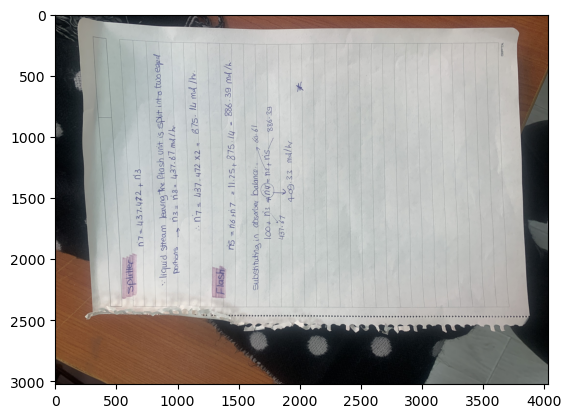

In [64]:
# example image:
imgTestPath = joinPaths(dataDir, '81. academicPhotos/76A8FA2B-4358-4CBD-9792-5C1771F0FE23.jpeg') # to do: title should change if the folder's naming structure is changed
img = Image.open(imgTestPath)
plt.imshow(img) 
plt.show()

the orientation 3 means that it should be rotated by 180 degrees, so it switched from <-- to -->, which is not what we want


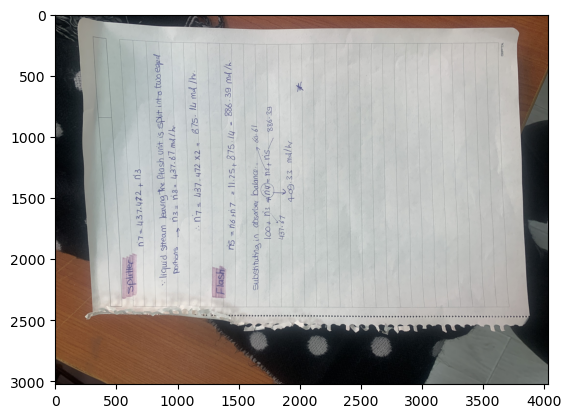

In [75]:
# example image:
img = Image.open(imgTestPath)
plt.imshow(img) 

# snippit from image_to_numpy package
exif_orientation_tag = 274
if hasattr(img, "_getexif") and isinstance(img._getexif(), dict) and exif_orientation_tag in img._getexif():
        exif_data = img._getexif()
        orientation = exif_data[exif_orientation_tag]
        print('the orientation', orientation, 'means that it should be rotated by 180 degrees, so it switched from <-- to -->, which is not what we want')


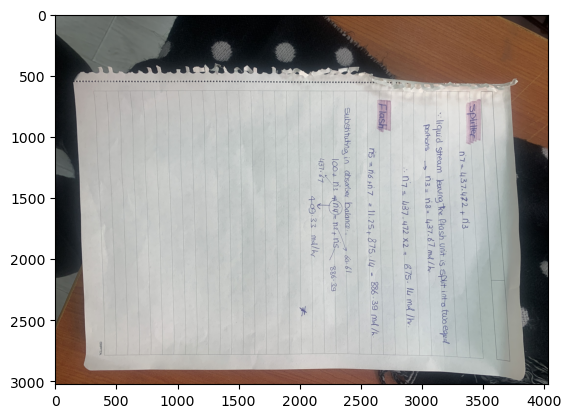

In [76]:
# trying out the package
img = image_to_numpy.load_image_file(imgTestPath)
plt.imshow(img)

As you can see from the two images above, some samples from the dataset will have false orientation in its metadata, so these will be harder to correctly rotate. However, when training the model, we can apply clockwise/anti-clockwise image augmentations to familiarize the model with corner cases as the one presented above

## About renaming the image files
As you've seen from the images above, the file names academic photos/digital images are not in the same convention as the other classes, so we'll rename the files, but we'll do so after the training is over and it becomes very probable that the dataset will not get altered again

## Visualizing Image Properties
Now, we want to decide how much downscaling/upscaling we want to do to our images, so we could do so understanding the general sizes of the images in our dataset <br>
most of the logic below is by [Aravind Ramalingam](https://medium.com/analytics-vidhya/how-to-pick-the-optimal-image-size-for-training-convolution-neural-network-65702b880f05)

In [226]:
# get image properties of each class
def getImgsPropsDf(datasetPaths=None):
    if datasetPaths is None:
        datasetPaths = [dp.absolute() for dp in Path(dataDir).iterdir() if re.match("^\d+\. ", dp.name)]
    df = None
    for dp in datasetPaths:
        # get the image names
        imgs = [img.name for img in dp.iterdir()]
        img_meta = {}
        for imgName in imgs: 
            img_meta[str(imgName)] = imagesize.get(os.path.join((os.path.normpath(dp.as_posix())), imgName)) # as_posix() converts WindowsPath object to just the string of the absolute path, while os.path.normpath() changes string to actual path based on o.s (e.g., '/' to '\\)
        # Convert it to Dataframe and compute aspect ratio
        img_meta_df = pd.DataFrame.from_dict([img_meta]).T.reset_index().set_axis(['file_name', 'size'], axis='columns', inplace=False)
        img_meta_df[["width", "height"]] = pd.DataFrame(img_meta_df["size"].tolist(), index=img_meta_df.index)
        img_meta_df["aspect_ratio"] = round(img_meta_df["width"] / img_meta_df["height"], 2)
        img_meta_df["area"] = img_meta_df["width"] * img_meta_df["height"]
        img_meta_df["class"] = dp.name
        img_meta_df["base_folder"] = dp.as_posix()
        print(f"Total Images in the dataset's class {dp.name}: {len(img_meta_df)}")
        if df is None:
            df = img_meta_df.copy()
        else:
            df = pd.concat([df, img_meta_df], axis=0) # axis = 0, as we want to stack dfs horizontally 
        df.reset_index(drop=True, inplace=True) # resetting index to be from 0 to df.shape[0], instead of repeating index values whenever we stack a new df
    return df

In [227]:
# checking return value of Pathlib library's method iterdir() of Path class
datasetPaths = [dp for dp in Path(dataDir).iterdir() if re.match("^\d+\. ", dp.name)]
datasetPaths

[WindowsPath('dataset/0. selfies'),
 WindowsPath('dataset/10. fmemes'),
 WindowsPath('dataset/20. ememes'),
 WindowsPath('dataset/30. eSocialMedia'),
 WindowsPath('dataset/40. fFbPosts'),
 WindowsPath('dataset/50. fTwtrPosts'),
 WindowsPath('dataset/60. fTxtMssgs'),
 WindowsPath('dataset/70. eGreetingAndMisc')]

In [228]:
imgPropertiesDf = getImgsPropsDf(datasetPaths[1:]) # excluding selfies folder, as all images in that folder are 306x306. Source of dataset: https://www.crcv.ucf.edu/data/Selfie/

Total Images in the dataset's class 10. fmemes: 31016
Total Images in the dataset's class 20. ememes: 14118
Total Images in the dataset's class 30. eSocialMedia: 4697
Total Images in the dataset's class 40. fFbPosts: 2006
Total Images in the dataset's class 50. fTwtrPosts: 927
Total Images in the dataset's class 60. fTxtMssgs: 16179
Total Images in the dataset's class 70. eGreetingAndMisc: 17044


In [229]:
imgPropertiesDf.sample(n = 5, random_state = 42)

,file_name,size,width,height,aspect_ratio,area,class,base_folder
69627,eGreetingAndMisc0000698.jpg,"(194, 260)",194,260,0.75,50440,70. eGreetingAndMisc,dataset/70. eGreetingAndMisc
13822,fmemes0013822.jpg,"(400, 300)",400,300,1.33,120000,10. fmemes,dataset/10. fmemes
11890,fmemes0011890.jpg,"(800, 800)",800,800,1.00,640000,10. fmemes,dataset/10. fmemes
49992,fFbPosts0000161.jpg,"(1242, 2208)",1242,2208,0.56,2742336,40. fFbPosts,dataset/40. fFbPosts
70798,eGreetingAndMisc0001898.jpg,"(225, 225)",225,225,1.00,50625,70. eGreetingAndMisc,dataset/70. eGreetingAndMisc


In [230]:
imgPropertiesDf['class'] = imgPropertiesDf['class'].str.replace('\d+\. ', '', regex=True)
#imgPropertiesDf.insert(0, "class", tmpDf.pop('class'))

In [231]:
# imgPropertiesDf.to_csv(dataReDir+'imgsPropsv1.csv', index=False)

In [13]:
imgPropertiesDf = pd.read_csv(dataReDir+'imgsPropsv1.csv')
imgPropertiesDf.sample(n=7, random_state=42,)

,file_name,size,width,height,aspect_ratio,area,class,base_folder
69627,eGreetingAndMisc0000698.jpg,"(194, 260)",194,260,0.75,50440,eGreetingAndMisc,dataset/70. eGreetingAndMisc
13822,fmemes0013822.jpg,"(400, 300)",400,300,1.33,120000,fmemes,dataset/10. fmemes
11890,fmemes0011890.jpg,"(800, 800)",800,800,1.00,640000,fmemes,dataset/10. fmemes
49992,fFbPosts0000161.jpg,"(1242, 2208)",1242,2208,0.56,2742336,fFbPosts,dataset/40. fFbPosts
70798,eGreetingAndMisc0001898.jpg,"(225, 225)",225,225,1.00,50625,eGreetingAndMisc,dataset/70. eGreetingAndMisc
61900,fTxtMssgs0009142.jpg,"(750, 1032)",750,1032,0.73,774000,fTxtMssgs,dataset/60. fTxtMssgs
29102,fmemes0029102.jpg,"(400, 400)",400,400,1.00,160000,fmemes,dataset/10. fmemes


In [14]:
# Lasso Selection of data points
# source: https://medium.com/analytics-vidhya/how-to-pick-the-optimal-image-size-for-training-convolution-neural-network-65702b880f05
class SelectFromCollection:
	def __init__(self, ax, collection, df, alpha_other=0.3):
		self.canvas = ax.figure.canvas
		self.collection = collection
		self.xys = collection.get_offsets()
		self.lasso = LassoSelector(ax, onselect=self.onselect)
		self.ind = []
		self.df = df
	def onselect(self, verts):
		path = mplPath(verts)
		self.ind = np.nonzero(path.contains_points(self.xys))[0]
		self.canvas.draw_idle()

	def disconnect(self):
		self.canvas.draw_idle()

# Show the original image upon picking the point
def on_pick(event):
	ind = event.ind[0]
	w, h = point.get_offsets().data[ind]
	img_file = Path(imgPropertiesDf.iloc[ind, 0])
	base_path = imgPropertiesDf.iloc[ind, -1]
	if Path(base_path, img_file).is_file():
		print(f"Showing: {img_file}")
		img = Image.open(Path(base_path, img_file))
		figs = plt.figure(figsize=(5, 5))
		axs = figs.add_subplot(111)
		axs.set_title(Path(img_file).name, size=14)
		axs.set_xticks([])
		axs.set_yticks([])
		axs.set_xlabel(f'Dim: {round(w)} x {round(h)}', size=14)
		axs.imshow(img)
		figs.tight_layout()
		figs.show()

# Save selected image filenames  
def save_selected_imgs(dfToDiscard, csvName = Path(dataDir, "Images to discard.csv")):
	if csvName.is_file():
		dfToDiscard.set_axis(['file_name'], axis='columns').to_csv(csvName, index=False)

# Store selected point upon pressing "enter"
def accept(event):
	if event.key == "enter":
		selected_imgs = imgPropertiesDf.iloc[selector.ind, 0].to_frame()
		save_selected_imgs(selected_imgs)
		print("Selected images:")
		print(selected_imgs)
		selector.disconnect()
		fig.canvas.draw()

def displayScatterWithLasso(df, xaxisColName="aspect_ratio"):
    # Plot the image resolutions        
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111)
    point = ax.scatter(df.width, df.height, color='blue', alpha=0.5, s=df[xaxisColName]*100, picker=True)
    ax.set_title("Press enter to after selecting the point.")
    ax.set_xlabel("width", size=14)
    ax.set_ylabel("height", size=14)
	# Add interaction
    selector = SelectFromCollection(ax, point, df)
    fig.canvas.mpl_connect("key_press_event", accept)
    fig.canvas.mpl_connect('pick_event', on_pick)
    plt.show()
    return df, fig, selector # has to return these in order to be read by accept() function

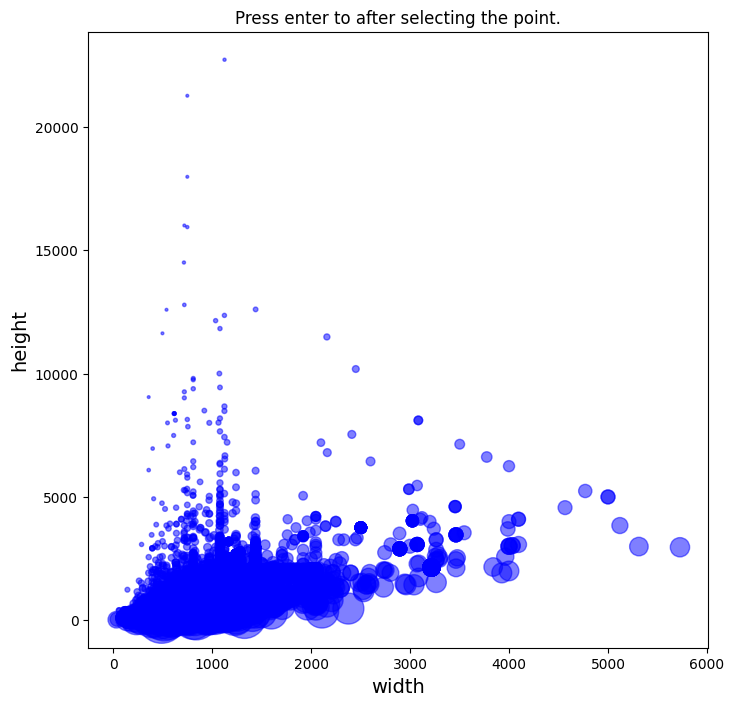

In [15]:
# works on jupyter notebook online, not vs code (not tested)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
point = ax.scatter(imgPropertiesDf.width, imgPropertiesDf.height, color='blue', alpha=0.5, s=imgPropertiesDf['aspect_ratio']*100, picker=True)
ax.set_title("Press enter to after selecting the point.")
ax.set_xlabel("width", size=14)
ax.set_ylabel("height", size=14)
# Add interaction
selector = SelectFromCollection(ax, point, imgPropertiesDf)
fig.canvas.mpl_connect("key_press_event", accept)
fig.canvas.mpl_connect('pick_event', on_pick)
plt.show()

In [19]:
# however, we want details of each class
# Therefore, that's what we'll do!
fig = px.scatter(x=imgPropertiesDf.width, y=imgPropertiesDf.height, color=imgPropertiesDf['class'], hover_name=imgPropertiesDf.file_name)
fig.update_layout({"xaxis":{"title":"Image Width"}, "yaxis":{"title":"Image Height"}})
fig.show()
# now in plotly, you can click on one of the colors on the right to hide/display it!
# side note: if you don't find these plots rendering, you can check this website (where I pasted the github link of this .ipynb file):
# https://nbviewer.org/github/OdyAsh/graduation_project/blob/ac3ddf010a288be5ce0725854099702355adcfea/dataset_preprocessing.ipynb

As we can see, the images' dimensions are very diverse in each of the folders (i.e., classes). <br> 
By selecting/deselecting labels from plotly's scatter plot, we can deduce the dimensions that each label is centered around:
* fmemes: 500x500
* ememes: 750x750
* eSocialMedia: 900x500
* fFbPosts: 1000x1000
* fTwtrPosts: 600x600
* fTxtMssgs: 1000x1000
* eGreetingAndMisc: 225x225

However, when we resize the images, we'll use an initial size of 306x306, as this is the size of all selfie images, and because in general, scaling down images is preferred to scaling up images, and in the case of `eGreetingAndMisc`, the upscale factor is relatively low.

After that, we might test different target sizes based on the initial model performance.

# Importing Images

In [32]:
train_datagen = ImageDataGenerator()
val_test_datagen = ImageDataGenerator()

train_data_iterator = train_datagen.flow_from_directory(f'{dataSplit}train/', classes=None, class_mode='categorical', # classes = None means that the classes will be inferred
                                        target_size=(306,306), seed=42, batch_size=32, color_mode='rgb', shuffle=True) # will later change to color_mode = grayscale

val_data_iterator = val_test_datagen.flow_from_directory(f'{dataSplit}val/', classes=None, class_mode='categorical',
                                        target_size=(306,306), seed=42, batch_size=32, color_mode='rgb', shuffle=True)

test_data_iterator = val_test_datagen.flow_from_directory(f'{dataSplit}test/', classes=None, class_mode='categorical',
                                        target_size=(306,306), seed=42, batch_size=32, color_mode='rgb', shuffle=False)

Found 92911 images belonging to 8 classes.
Found 26544 images belonging to 8 classes.
Found 13280 images belonging to 8 classes.


In [19]:
train_data_iterator.class_indices

{'00. selfies': 0,
 '10. fmemes': 1,
 '20. ememes': 2,
 '30. eSocialMedia': 3,
 '40. fFbPosts': 4,
 '50. fTwtrPosts': 5,
 '60. fTxtMssgs': 6,
 '70. eGreetingAndMisc': 7}

In [20]:
# confirming the iterator works
batchX, batchy = train_data_iterator.next()
print(f'Batch shape={batchX.shape}, min={batchX.min()}, max={batchX.max()}')
print(batchy)
# displaying sample image, doesn't work if we don't rescale the images' intensities to 1/255
# plt.figure()
# plt.imshow(batchX[5]) 
# plt.show()

Batch shape=(32, 306, 306, 3), min=0.0, max=255.0
[[1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0.]]


# Initial Model Performance
This is just to write the initial model pipeline that will be used in `models.ipynb`

In [21]:
# source: https://www.analyticsvidhya.com/blog/2022/07/training-cnn-from-scratch-using-the-custom-dataset/

model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(306, 306, 3)))

model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))

model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))

model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))

model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(512, activation='relu'))

model.add(layers.Dense(len(train_data_iterator.class_indices), activation='softmax')) # first argument == number of classes

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 304, 304, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 152, 152, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 150, 150, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 75, 75, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 73, 73, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 128)       1

In [22]:
# source: https://stackoverflow.com/questions/60738503/tensorflow-keras-in-a-multi-class-classification-accuracy-is-high-but-precis

f1 = tfa.metrics.F1Score(num_classes=len(train_data_iterator.class_indices), average=None, name="f1_score") # , average='macro'

# notes (source: https://stackoverflow.com/questions/66803701/micro-vs-macro-vs-weighted-f1-score):
# average=None: Return an array of f1 score for each class
# average=micro: Calculate metrics globally by counting the total true positives, false negatives and false positives. (equivalent to normal average metric)
# average=macro: Calculate metrics for each label, and find their unweighted mean. This does not take label imbalance into account.
# average=weighted: The weighted-averaged F1 score is calculated by taking the mean of all per-class F1 scores while considering each class’s support. (source: https://www.kdnuggets.com/2023/01/micro-macro-weighted-averages-f1-score-clearly-explained.html#:~:text=(4)-,Weighted%20Average,-The%C2%A0weighted)
#                   Support: It refers to the number of actual occurrences of the class in the dataset.

In [23]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc', f1])
print(train_data_iterator.samples, train_data_iterator.batch_size)
print(val_data_iterator.samples, val_data_iterator.batch_size)
print(test_data_iterator.samples, test_data_iterator.batch_size)
spe = train_data_iterator.samples // train_data_iterator.batch_size
vsteps = val_data_iterator.samples // val_data_iterator.batch_size
tsteps = test_data_iterator.samples // test_data_iterator.batch_size
print(spe)
print(vsteps)
print(tsteps)

92911 32
26544 32
13280 32
2903
829
415


In [223]:
ImageFile.LOAD_TRUNCATED_IMAGES = True # allow truncated images to be read by PIL, which is used by keras's .fit()
# source 1: https://stackoverflow.com/questions/69792025/unknownerror-oserror-image-file-is-truncated-30-bytes-not-processed
# source 2: https://stackoverflow.com/questions/12984426/pil-ioerror-image-file-truncated-with-big-images

# history = model.fit(x=train_data_iterator, steps_per_epoch=spe, epochs=1, validation_data=val_data_iterator, validation_steps=vsteps, workers=10, verbose=2)

2903/2903 - 4135s - loss: 1.3529 - acc: 0.7731 - f1_score: 0.6296 - val_loss: 0.3062 - val_acc: 0.9026 - val_f1_score: 0.7960 - 4135s/epoch - 1s/step


In [33]:
with mirrorStrategy.scope():
    ImageFile.LOAD_TRUNCATED_IMAGES = True # allow truncated images to be read by PIL, which is used by keras's .fit()
    f1 = tfa.metrics.F1Score(num_classes=len(train_data_iterator.class_indices), average=None, name="f1_score") # , average='macro'
    model = models.Sequential()
    model.add(layers.Conv2D(32, (3, 3), activation='relu',input_shape=(306, 306, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.Dense(len(train_data_iterator.class_indices), activation='softmax')) # first argument == number of classes
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc', f1])
    checkpointer = ModelCheckpoint('models/m0xcnn.h5', verbose=0)
    model.fit(x=train_data_iterator, steps_per_epoch=spe, 
                epochs=1, validation_data=val_data_iterator, validation_steps=vsteps, 
                workers=10, verbose=2,callbacks=[checkpointer])

In [25]:
# model.save("models/m00cnn.h5")
# history = history.__dict__
# history.pop('model', None) # remove model, as pickle won't be properly loaded otherwise with error "FileNotFoundError: Unsuccessful TensorSliceReader constructor"
model = keras.models.load_model('models/m00cnn.h5')

In [259]:
# yPredOneHotEncoded = model.predict(test_data_iterator, workers=10) #, steps=tsteps 
                                                                    # you don't have to add steps, 
                                                                    # as predict() automatically calculates samples//batch_size for you 
                                                                    # to exhaust all test images in test folder

415/415 [==============================] - 121s 291ms/step


In [26]:
# this cell was added after an initial run was preformed and history was saved
history = pklLoad('models/m00history.pickle')
yPredOneHotEncoded = history['test_yPred']

In [27]:
# source: https://stackoverflow.com/questions/69109151/how-to-view-the-image-from-test-generator-to-see-if-the-prediction-is-correct-or

yPred = []
yPredClassNames = []
yTruesClassNames = []
probs = []

for i, pred in enumerate(yPredOneHotEncoded): # test_data_iterator must have shuffle = False for this to work
    index = np.argmax(pred)
    predClass = numToImgType[index]    
    prob = pred[index]
    trueClass = numToImgType[test_data_iterator.labels[i]]
    
    yPred.append(index)
    yPredClassNames.append(predClass)
    probs.append(prob)
    yTruesClassNames.append(trueClass)

testImgsPaths = test_data_iterator.filenames[:len(yPred)]
yTrue = test_data_iterator.labels[:len(yPred)]

df = pd.DataFrame({
    'image name' : testImgsPaths, 
    'predicted label' : yPred, 
    'actual label' : yTrue, 
    'prediction probability' : probs, 
    'predicted class name' : yPredClassNames, 
    'actual class name' : yTruesClassNames
    })

In [28]:
# source: https://stackoverflow.com/questions/2148543/how-to-write-a-confusion-matrix
cmDf = pd.crosstab(pd.Series(yTrue, name="actual"), pd.Series(yPred, name="predicted"), margins=True)
cmDf.columns = pd.Series(list(test_data_iterator.class_indices.keys())+['All'], name='predicted')
cmDf.index = pd.Series(list(test_data_iterator.class_indices.keys())+['All'], name='actual')
cmDf

predicted,00. selfies,10. fmemes,20. ememes,30. eSocialMedia,40. fFbPosts,50. fTwtrPosts,60. fTxtMssgs,70. eGreetingAndMisc,All
actual,,,,,,,,,
00. selfies,4628,5,14,0,0,0,2,36,4685
10. fmemes,2,3084,10,0,2,0,1,3,3102
20. ememes,201,8,983,15,5,1,80,117,1410
30. eSocialMedia,1,0,19,442,0,0,5,3,470
40. fFbPosts,3,2,11,0,92,7,79,7,201
50. fTwtrPosts,0,0,3,0,11,32,47,1,94
60. fTxtMssgs,23,5,35,1,30,4,1497,24,1619
70. eGreetingAndMisc,308,6,161,3,1,0,29,1191,1699
All,5166,3110,1236,461,141,44,1740,1382,13280


In [29]:
cmNormDf = cmDf.iloc[:-1, :-1].div(cmDf.iloc[:-1, :-1].sum(axis=1), axis="index").round(3)
cmNormDf

predicted,00. selfies,10. fmemes,20. ememes,30. eSocialMedia,40. fFbPosts,50. fTwtrPosts,60. fTxtMssgs,70. eGreetingAndMisc
actual,,,,,,,,
00. selfies,0.988,0.001,0.003,0.000,0.000,0.000,0.000,0.008
10. fmemes,0.001,0.994,0.003,0.000,0.001,0.000,0.000,0.001
20. ememes,0.143,0.006,0.697,0.011,0.004,0.001,0.057,0.083
30. eSocialMedia,0.002,0.000,0.040,0.940,0.000,0.000,0.011,0.006
40. fFbPosts,0.015,0.010,0.055,0.000,0.458,0.035,0.393,0.035
50. fTwtrPosts,0.000,0.000,0.032,0.000,0.117,0.340,0.500,0.011
60. fTxtMssgs,0.014,0.003,0.022,0.001,0.019,0.002,0.925,0.015
70. eGreetingAndMisc,0.181,0.004,0.095,0.002,0.001,0.000,0.017,0.701


In [30]:
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H4('Confusion Matrix of Original Dataset (m01)'),
    dcc.Graph(id="graph"),
    html.P("Classes included:"),
    dcc.Checklist(
        id='classes',
        options=list(test_data_iterator.class_indices.keys()),
        value=list(test_data_iterator.class_indices.keys()),
    ),
])

app.css.config.serve_locally = True
app.scripts.config.serve_locally = True

@app.callback(
    Output("graph", "figure"), 
    Input("classes", "value"))
def create_cm(cols):
    df = cmNormDf
    fig = px.imshow(df[cols], text_auto=True, aspect="auto", width=800, height=600, color_continuous_scale=[(0.00, "white"), (0.50, "black"), (1.00, "green")])
    return fig

app.run_server(debug=True, mode='inline')

In [50]:
def getMetrics(yTrue, yPred, test_gen): 
    # Returns a dictionary of loss, accuracy, f1 score, and support based on sklearn's classification report
    # Arguments:
    # yTrue is a list of single values (e.g., [2, 1])
    # yPred is a list of lists representing each class (e.g., [[0.1, 0.1, 0.8], [0.2, 0.7, 0.1]])
    crDict = classification_report(yTrue, np.argmax(yPred, axis=1), target_names=list(test_gen.class_indices.keys()), output_dict=True)
    f1s = []
    supports = []
    for key, val in sorted(crDict.items()):
        if (key == 'accuracy'): 
            break
        f1s.append(round(val['f1-score'], 5))
        supports.append(val['support'])
    f1s = np.array(f1s)
    supports = np.array(supports)
    
    scce = keras.losses.SparseCategoricalCrossentropy()
    test_loss = scce(yTrue, yPred).numpy() 
    # note that this should gave same result as loss function "categorical_crossentropy" used to obtain "loss" and "val_loss"
    # Proof: compare the final result (1.177) of these two examples:
    # https://www.tensorflow.org/api_docs/python/tf/keras/losses/SparseCategoricalCrossentropy#:~:text=Use%20this%20crossentropy,numpy()%0A1.177
    # https://www.tensorflow.org/api_docs/python/tf/keras/losses/CategoricalCrossentropy#:~:text=Use%20this%20crossentropy,numpy()%0A1.177
    
    # source: https://stackoverflow.com/questions/2148543/how-to-write-a-confusion-matrix
    cmDf = pd.crosstab(pd.Series(yTrue, name="actual"), pd.Series(np.argmax(yPred, axis=1), name="predicted"), margins=True)
    cmDf.columns = pd.Series(list(test_gen.class_indices.keys())+['All'], name='predicted')
    cmDf.index = pd.Series(list(test_gen.class_indices.keys())+['All'], name='actual')
    cmNormDf = cmDf.iloc[:-1, :-1].div(cmDf.iloc[:-1, :-1].sum(axis=1), axis="index").round(3)

    metrics = {
        "test_loss" : round(test_loss, 5),
        "test_acc" : round(crDict['accuracy'], 5),
        "test_f1_score" : f1s,
        "test_support" : supports,
        "test_yTrue" : yTrue, # labels
        "test_yPred" : yPred, # vectors of probabilities
        "test_confusion_matrix" : cmDf,
        "test_confusion_matrix_normalized" : cmNormDf
    }
    return metrics

In [32]:
def organizeHistory(history):
    # history will now have the following keys 
    # (with most keys having np.arrays, not python lists):
    # 'validation_data',
    # '_chief_worker_only',
    # '_supports_tf_logs',
    # 'params',
    # 'loss',
    # 'acc',
    # 'f1_score',
    # 'val_loss',
    # 'val_acc',
    # 'val_f1_score',
    # 'test_loss',
    # 'test_acc',
    # 'test_f1_score',
    # 'test_support',
    # 'test_yTrue',
    # 'test_yPred',
    # 'test_confusion_matrix',
    # 'test_confusion_matrix_normalized'
    h = history.copy()
    nestedHistoryDict = h.pop('history')
    h.update(nestedHistoryDict)
    h['loss'] = np.round(np.array(h['loss']), 5)
    h['acc'] = np.round(np.array(h['acc']), 5)
    h['val_loss'] = np.round(np.array(h['val_loss']), 5)
    h['val_acc'] = np.round(np.array(h['val_acc']), 5)
    
    if len(h['f1_score']) == 1:
        h['f1_score'] = h['f1_score'][0]
    if len(h['val_f1_score']) == 1:
        h['val_f1_score'] = h['val_f1_score'][0]
    if len(h['test_f1_score']) == 1:
        h['test_f1_score'] = h['test_f1_score'][0]

    h['f1_score'] = np.round(np.array(h['f1_score']), 5)
    h['val_f1_score'] = np.round(np.array(h['val_f1_score']), 5)
    h['test_f1_score'] = np.round(np.array(h['test_f1_score']), 5)
    
    return h

In [81]:
# history['history'].update(getMetrics(yTrue, yPredOneHotEncoded, test_data_iterator))
# history = organizeHistory(history)
# pklSave(history, 'models/m00history.pickle')
history = pklLoad('models/m00history.pickle')
history

{'validation_data': None,
 '_chief_worker_only': None,
 '_supports_tf_logs': False,
 'params': {'verbose': 2, 'epochs': 1, 'steps': 2903},
 'loss': array([1.35295]),
 'acc': array([0.77311]),
 'f1_score': array([0.8262 , 0.91264, 0.54549, 0.80033, 0.27231, 0.34677, 0.7385 ,
        0.59454], dtype=float32),
 'val_loss': array([0.30622]),
 'val_acc': array([0.90259]),
 'val_f1_score': array([0.94266, 0.99339, 0.74319, 0.95428, 0.51252, 0.54545, 0.88717,
        0.78931], dtype=float32),
 'test_loss': 0.30572,
 'test_acc': 0.89977,
 'test_f1_score': array([0.9396 , 0.99292, 0.74301, 0.94952, 0.53801, 0.46377, 0.89134,
        0.77313]),
 'test_support': array([4685, 3102, 1410,  470,  201,   94, 1619, 1699]),
 'test_yTrue': array([0, 0, 0, ..., 7, 7, 7]),
 'test_yPred': array([[9.90522802e-01, 1.09824316e-06, 1.64947996e-03, ...,
         4.55167533e-13, 6.15418821e-06, 7.82045070e-03],
        [9.14161444e-01, 4.44900397e-05, 2.25865990e-02, ...,
         2.97146086e-09, 1.65044257e-04,

In [34]:
df.insert(1, 'image', df.apply(lambda row: joinPaths('dataset_split/test/', row['image name']), axis=1))
df['image name'] = df.apply(lambda row: os.path.basename(row['image name']), axis=1)
df

,image name,image,predicted label,actual label,prediction probability,predicted class name,actual class name
0,selfies0000026.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.990523,00. selfies,00. selfies
1,selfies0000037.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.914161,00. selfies,00. selfies
2,selfies0000044.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.985750,00. selfies,00. selfies
3,selfies0000071.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.698585,00. selfies,00. selfies
4,selfies0000075.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.967001,00. selfies,00. selfies
...,...,...,...,...,...,...,...
13275,eGreetingAndMisc0017386.jpg,dataset_split\test\70. eGreetingAndM...,2,7,0.935355,20. ememes,70. eGreetingAndMisc
13276,eGreetingAndMisc0017402.jpg,dataset_split\test\70. eGreetingAndM...,0,7,0.526136,00. selfies,70. eGreetingAndMisc
13277,eGreetingAndMisc0017412.jpg,dataset_split\test\70. eGreetingAndM...,0,7,0.908237,00. selfies,70. eGreetingAndMisc
13278,eGreetingAndMisc0017423.jpg,dataset_split\test\70. eGreetingAndM...,2,7,0.464016,20. ememes,70. eGreetingAndMisc


In [35]:
dfSus = df[(df['predicted label'] != df['actual label']) | (df['prediction probability'] <= 0.5)].reset_index(drop=True) # sus == suspicious; misclassified or low probability
dfSus

,image name,image,predicted label,actual label,prediction probability,predicted class name,actual class name
0,selfies0000363.jpg,dataset_split\test\00. selfies\selfi...,7,0,0.425343,70. eGreetingAndMisc,00. selfies
1,selfies0000829.jpg,dataset_split\test\00. selfies\selfi...,7,0,0.443911,70. eGreetingAndMisc,00. selfies
2,selfies0001034.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.392077,00. selfies,00. selfies
3,selfies0001721.jpg,dataset_split\test\00. selfies\selfi...,7,0,0.859605,70. eGreetingAndMisc,00. selfies
4,selfies0002473.jpg,dataset_split\test\00. selfies\selfi...,0,0,0.362011,00. selfies,00. selfies
...,...,...,...,...,...,...,...
1610,eGreetingAndMisc0017386.jpg,dataset_split\test\70. eGreetingAndM...,2,7,0.935355,20. ememes,70. eGreetingAndMisc
1611,eGreetingAndMisc0017402.jpg,dataset_split\test\70. eGreetingAndM...,0,7,0.526136,00. selfies,70. eGreetingAndMisc
1612,eGreetingAndMisc0017412.jpg,dataset_split\test\70. eGreetingAndM...,0,7,0.908237,00. selfies,70. eGreetingAndMisc
1613,eGreetingAndMisc0017423.jpg,dataset_split\test\70. eGreetingAndM...,2,7,0.464016,20. ememes,70. eGreetingAndMisc


In [263]:
# source 1: https://towardsdatascience.com/rendering-images-inside-a-pandas-dataframe-3631a4883f60
# source 2: https://stackoverflow.com/questions/16191974/save-image-content-inside-html-file
# source 3: https://stackoverflow.com/questions/16191974/save-image-content-inside-html-file
def pathToImageHtml(path): 
    img = cv2.imread(path) # if we were to use "with open()", then we have to provide paths with "/" separators
    imgDims = (100, 100)
    img = cv2.resize(img, imgDims, interpolation=cv2.INTER_AREA)
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), 95] # compress image to 95% of original image
    base64BinaryImg = base64.b64encode(cv2.imencode('.jpg', img, encode_param)[1]) # source: https://stackoverflow.com/questions/40768621/python-opencv-jpeg-compression-in-memory
    base64StringImg = base64BinaryImg.decode()
    return f'<img src="data:image/jpg;base64,{base64StringImg}" width="{imgDims[0]}" height="{imgDims[1]}" />' # adding base64 encoding of image to preserve it in html page instead of relying on relative paths

# saving the dataframe with misclassified labels or low probability and with images displayed (in "image" column) locally
dfSus.drop(dfSus.columns[[2,3]], axis=1).to_html('dataset_related/Original Dataset - Results On Test Data.html', escape=False, formatters=dict(image = pathToImageHtml))
# we can now see the results by opening the html page in the directory stated above

In [271]:
classDist = np.unique(train_data_iterator.classes, return_counts=True)
classDist

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([32783, 21711,  9867,  3285,  1404,   648, 11324, 11889],
       dtype=int64))

In [272]:
dfTmp = pd.DataFrame(history['val_f1_score'], columns=train_data_iterator.class_indices).T
dfTmp['f1 scores'] = dfTmp[0]
dfTmp['training examples ratio'] = classDist[1] / np.max(classDist[1])
dfTmp['training examples'] = classDist[1]
dfTmp.pop(0)
dfTmp

,f1 scores,training examples ratio,training examples
00. selfies,0.942662,1.000000,32783
10. fmemes,0.993388,0.662264,21711
20. ememes,0.743186,0.300979,9867
30. eSocialMedia,0.954277,0.100204,3285
40. fFbPosts,0.512518,0.042827,1404
50. fTwtrPosts,0.545455,0.019766,648
60. fTxtMssgs,0.887173,0.345423,11324
70. eGreetingAndMisc,0.789305,0.362657,11889


In [273]:
fig = px.bar(dfTmp, title="Validation F1 Scores", text_auto=False, width=1350, barmode="group", hover_data=['training examples'])
fig.update_layout(xaxis=dict(title="Class"), yaxis=dict(title="f1 score"), showlegend=True, yaxis_range=[0,1])

# Refactoring Model Pipeline Logic into Functions

In [55]:
def histSub(keyword, hist=None, labels=False, cm=False): # history subset
    if hist is None:
        global history
        hist = history.copy()
    hSub = {}
    for key in hist.keys():
        if keyword in key:
            if ('_y' in key and not labels) or ('confusion_matrix' in key and not cm):
                continue
            hSub.update({key: hist[key]})
    return hSub

In [ ]:
def trainModel(model, train_gen, val_gen, test_gen, model_file_name, steps_per_epoch=None, epochs=1, validation_steps=None, workers=10, verbose=2, optimizer="adam", additionalMetrics=[], load=False):
    # Trains & tests model, then returns the trained model with metrics in "history" dictionary and test predictions
    # Pre requisites: 
    # install pillow then "from PIL import Image, ImageFile"
    # install tensorflow_addons then "import tensorflow_addons as tfa"
    # "import regex as re"
    #
    # before calling the function, execute: "mirrorStrategy = tf.distribute.MirroredStrategy()"
    # and encompass the lines of creating the model in "with mirrorStrategy.scope()"
    #
    # model_file_name must contain an integer in its string, to be used in naming the history pickle file, and it has to be unique 
    # i.e., if you have a pickle/model file with "1" as the first digit sequence occurence in its name, then don't use "1" again, as that will overwrite the previous pickle file
    
    if load:
        model = keras.models.load_model(f'models/{model_file_name}')
        modelNumber = re.findall(r'\d+', model_file_name)[0]
        history = pklLoad(f'models/m{modelNumber}history.pickle')
        return model, history
        
    if (steps_per_epoch is None):
        steps_per_epoch = train_gen.samples // train_gen.batch_size
    if (validation_steps is None):
        validation_steps = val_gen.samples // val_gen.batch_size

    with mirrorStrategy.scope():
        f1 = tfa.metrics.F1Score(num_classes=len(train_gen.class_indices), average=None, name="f1_score") # , average='macro'
        ImageFile.LOAD_TRUNCATED_IMAGES = True # allow truncated images to be read by PIL, which is used by keras's .fit()
        model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['acc', f1, *additionalMetrics])
        checkpointer = ModelCheckpoint(f'models/{model_file_name}', verbose=0)
        history = model.fit(x=train_gen, steps_per_epoch=steps_per_epoch, epochs=epochs, validation_data=val_gen, validation_steps=validation_steps, workers=workers, verbose=verbose)
        model.save(f'models/{model_file_name}')
        yPredOneHotEncoded = model.predict(test_gen, workers=10)
        yTrue = test_gen.labels[:len(yPredOneHotEncoded)]

    try:
        modelNumber = re.findall(r'\d+', model_file_name)[0]
    except:
        modelNumber = np.random.randint(low=50, high=99) # some high arbitrary number

    history = history.__dict__
    history.pop('model', None) # remove model, as pickle won't be properly loaded otherwise with error "FileNotFoundError: Unsuccessful TensorSliceReader constructor"
    history['modelNumber'] = modelNumber
    history['history'].update(getMetrics(yTrue, yPredOneHotEncoded, test_gen))
    history = organizeHistory(history)
    
    pklSave(history, f'models/m{modelNumber}history.pickle')
    
    return model, history

In [36]:
def createTestResultsDf(yPredOneHotEncoded, test_gen, history, datasetDescription, saveHtml=False):
    # returns df of misclassified test examples, and saves html of this df with the name provided in "datasetDescription" as prefix
    yPred = []
    yPredClassNames = []
    yTruesClassNames = []
    probs = []
    labelToClassName = {v: k for k, v in test_gen.class_indices.items()}

    for i, pred in enumerate(yPredOneHotEncoded): # test_data_iterator must have shuffle = False for this to work
        index = np.argmax(pred)
        predClass = labelToClassName[index]    
        prob = pred[index]
        trueClass = labelToClassName[test_gen.labels[i]]
        
        yPred.append(index)
        yPredClassNames.append(predClass)
        probs.append(prob)
        yTruesClassNames.append(trueClass)

    testImgsPaths = test_gen.filenames[:len(yPred)]
    yTrue = test_gen.labels[:len(yPred)]

    df = pd.DataFrame({
        'image name' : testImgsPaths, 
        'predicted label' : yPred, 
        'actual label' : yTrue, 
        'prediction probability' : probs, 
        'predicted class name' : yPredClassNames, 
        'actual class name' : yTruesClassNames
        })

    df.insert(1, 'image', df.apply(lambda row: joinPaths('dataset_split/test/', row['image name']), axis=1))
    df['image name'] = df.apply(lambda row: os.path.basename(row['image name']), axis=1)
    df = df[(df['predicted label'] != df['actual label']) | (df['prediction probability'] <= 0.5)].reset_index(drop=True) # misclassified or low probability
    
    def pathToImageHtml(path): 
        img = cv2.imread(path) # if we were to use "with open()", then we have to provide paths with "/" separators
        imgDims = (100, 100)
        img = cv2.resize(img, imgDims, interpolation=cv2.INTER_AREA)
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), 95] # compress image to 95% of original image
        base64BinaryImg = base64.b64encode(cv2.imencode('.jpg', img, encode_param)[1]) # source: https://stackoverflow.com/questions/40768621/python-opencv-jpeg-compression-in-memory
        base64StringImg = base64BinaryImg.decode()
        return f'<img src="data:image/jpg;base64,{base64StringImg}" width="{imgDims[0]}" height="{imgDims[1]}" />' # adding base64 encoding of image to preserve it in html page instead of relying on relative paths
    
    if saveHtml:
        # saving the dataframe with misclassified labels or low probability and with images displayed (in "image" column) locally and without predicted/actual labels
        df.drop(df.columns[[2,3]], axis=1, inplace=False).to_html(f'dataset_related/{datasetDescription} - Results On Test Data.html', escape=False, formatters=dict(image = pathToImageHtml))
        # we can now see the results by opening the html page in the directory stated above

    return df

In [46]:
histSub('f1')

{'f1_score': array([0.8262 , 0.91264, 0.54549, 0.80033, 0.27231, 0.34677, 0.7385 ,
        0.59454], dtype=float32),
 'val_f1_score': array([0.94266, 0.99339, 0.74319, 0.95428, 0.51252, 0.54545, 0.88717,
        0.78931], dtype=float32),
 'test_f1_score': 0.9396}

In [327]:
def plotTypeSingleModel(history, accType='all', average=False, width=1380, yAxisZeroToOne=False):
    if yAxisZeroToOne:
        additionalArgs = {"yaxis_range" : [0,1]}
    else:
        additionalArgs = {}
    if len(history['epoch']) == 1:
        oneEpoch = True
    else:
        oneEpoch = False
    
    figs = {}
    
    if accType == 'all' or "acc" in accType.lower():
        fig = px.line(pd.DataFrame(
                {'Train Score':list(history['acc']), 'Val Score':list(history['val_acc'])}, 
                index=pd.RangeIndex(start=1, stop=len(list(history['acc']))+1, name='Epoch')
            ), 
            title="Accuracy Scores",
            markers=True, width=width)
        fig.update_layout(yaxis_title="Accuracy", legend_title_text="Accuracy", **additionalArgs)
        fig.add_annotation(
            text=f" Test Score: <br>{history['test_acc']}",
            align="center",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(color="black", size=13),
            y=0.75,
            x=1.03,
            bordercolor='black',
            borderwidth=2,
            xanchor="left",
        )
        figs['all_acc'] = fig

    if accType == 'all' or  "f1" in accType.lower():
        dashStyles = ['solid', 'dot', 'dash', 'longdash', 'dashdot', 'longdashdot']
        classNameToNum = pklLoad('dataset_related/imgTypeToNum.pickle')
        classList = list(classNameToNum.keys())
        scoreTypes = [('', 'Training', 'f1_score'), ('val_', 'Validation', 'val_f1_score'), ('test_', 'Test', 'test_f1_score')]
        for i in range(3):
            
            if oneEpoch or average or i == 2:
                dfAvgOrTest = pd.DataFrame(
                                        {'class' : classList, 
                                        'value' : pd.DataFrame(history[f'{scoreTypes[i][0]}f1_score'], columns=classList).mean().values 
                                            if average and i != 2 
                                            else history[f'{scoreTypes[i][0]}f1_score']}, 
                                        index=classList)
                fig = px.bar(dfAvgOrTest, title=f"{scoreTypes[i][1]} F1 {'Average' if average and i != 2 else 'Score'}", color='class', text_auto=False, width=width)
                fig.update_layout(xaxis=dict(title="Class"), yaxis=dict(title="F1 score"), showlegend=True, **additionalArgs)
                figs[scoreTypes[i][2]] = fig
                continue
            
            dfTmp = pd.DataFrame(history[f'{scoreTypes[i][0]}f1_score'], columns=classList)
            dfTmp.index += 1
            fig = px.line(dfTmp, title=f"{scoreTypes[i][1]} F1 Scores", markers=True, width=width)
            for j in range(len(classList)):
                if j >= len(dashStyles):
                    k = 1
                else:
                    k = j
                fig.update_traces(selector={"name": classList[j]}, line={"dash": dashStyles[k]})
            fig.update_layout(xaxis=dict(title="Epochs"), yaxis=dict(title="F1 Score"), legend_title_text="Class Type", **additionalArgs)
            figs[scoreTypes[i][2]] = fig

    return figs

In [ ]:
# run the following block in models.ipynb to compactly run the train, test, plot pipeline
model, history = trainModel(model, 
        train_gen, 
        val_gen, 
        test_gen, 
        modelFileName, 
        steps_per_epoch=None, 
        epochs=1, 
        validation_steps=None, 
        workers=10, 
        verbose=2, 
        optimizer="adam", 
        additionalMetrics=[],
        load=False)

# # When you want to load the model
model, history = trainModel(model, 
                        train_gen, 
                        val_gen, 
                        test_gen, 
                        modelFileName, 
                        load=True)
dfTestResults = createTestResultsDf(history['test_yPred'], test_gen, history, datasetDescription, saveHtml=True)
figDict = plotTypeSingleModel(history, accType='all', average=False, width=1380, yAxisZeroToOne=False)

And now, we can go to `models.ipynb` to train the model above with 30 epochs, and try out new models! 